## Question 2 : The output could not be printed, hence the output was written into a drive.

The drive link is : https://drive.google.com/drive/folders/1Vdp8BILsAe1K6tcQZQ2cIxNtCDt3WRy5?usp=sharing

The naming of the files are named according to the desired required outputs


In [1]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [2]:
#Importing required libraries
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import os
import random
import math

In [37]:
def identifymatchingfeatures(image1,image2):
  #SIFT Algorithm to find keypoints and descriptors
  sift=cv.SIFT_create()

  #Converting the image to gray to detect matching features
  gray_img1= cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
  gray_img2= cv.cvtColor(image2, cv.COLOR_BGR2GRAY)

  #Obtaining the keypoints and descriptors for both the images
  keypoints_1, descriptors_1 = sift.detectAndCompute(image1, None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(image2, None)


  # FLANN parameters
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks=50)
  flann=cv.FlannBasedMatcher(index_params,search_params)
  #Obtaining the matched points between two images using Flann Based Matcher
  matched=flann.knnMatch(descriptors_1,descriptors_2,k=2)

  #Extracting the good matching points from the matching points using Lowe's method
  goodpoints=[]
  pts1 = []
  pts2 = []
  for i,(m,n) in enumerate(matched):
    if m.distance < 0.7*n.distance:
      goodpoints.append(m)
      pts2.append(keypoints_2[m.trainIdx].pt)
      pts1.append(keypoints_1[m.queryIdx].pt)
  pts1 = np.int32(pts1)
  pts2 = np.int32(pts2)
  return pts1,pts2

#Estimating the fundamental matrix usign RANSAC method based on matching features obtained from executing the previous function
def fundamental_matrix_cal(matched_keypoints1, matched_keypoints2):
  F, inl = cv.findFundamentalMat(matched_keypoints1, matched_keypoints2, cv.RANSAC, ransacReprojThreshold=0.5, confidence=0.99)
  return F, inl

#Computing the essential matrix using fundamental matrix and camera matrices
def essentialmatrix(k1,k2,F):
  essmat=k2.T @ F @ k1
  return essmat

#Decomposing the obtained essential matrix to obtain rotation and translation matrices
def decomposematrix(E,p1,p2,cameraMatrix1,cameraMatrix2):
  success, R, T, mask = cv.recoverPose(E, p1, p2, cameraMatrix1)
  return R, T

#Applying perspective transform to rectify the images. Also, ensuring that the lines are horizontal in the image
def rectification(img1, img2, pts1, pts2, F, width,height, r,t,cam00,cam10):
  #Obtaining the HomoGraphy Matrices H1 and H2
  R1, R2, P1, P2, Q, roi1, roi2 = cv.stereoRectify(cam00, None, cam10, None, (1920, 1080), r, t)
  map1x, map1y = cv.initUndistortRectifyMap(cam0, None, R1, P1, (1920, 1080), cv.CV_32FC1)
  map2x, map2y = cv.initUndistortRectifyMap(cam1, None, R2, P2, (1920, 1080), cv.CV_32FC1)
  #Rectification
  rectified1 = cv.remap(img1, map1x, map1y, cv.INTER_LINEAR)
  rectified2 = cv.remap(img2, map2x, map2y, cv.INTER_LINEAR)
  #Obtaining Homography Matrices using Rotation Matrix
  H1=cam00 @ R1 @ np.linalg.inv(cam00)
  H2=cam10 @ R2 @ np.linalg.inv(cam10)
  return rectified1, rectified2, P1, P2,R1, R2, H1,H2

#Function to compute the epipolar lines
def epipolarlines(img1, img2, pts1, pts2, F):
  lines1 = cv.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 2, F).reshape(-1, 3)
  r, c, _ = img1.shape
  pts1 = pts1.astype(np.int32)
  pts2 = pts2.astype(np.int32)
  #Drawing the feature points and epipolar lines on the rectified images
  for r,pt1,pt2 in zip(lines1,pts1,pts2):
      color = (0,255,0)
      x0,y0 = map(int, [0, -r[2]/r[1] ])
      x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
      img1 = cv.line(img1, (x0,y0), (x1,y1), color,1)
      img1 = cv.circle(img1,tuple(pt1),5,color,-1)
      img2 = cv.circle(img2,tuple(pt2),5,color,-1)
  # cv2_imshow(img1)
  return img1

#Function to obtain the disparity map
def disparitymap(dispimg1,dispimg2,n,m,stri1,stri2):
  gray1=cv.cvtColor(dispimg1, cv.COLOR_BGR2GRAY)
  gray2=cv.cvtColor(dispimg2, cv.COLOR_BGR2GRAY)
  #Initialising the parameters and computing the disparity map using the rectified images
  disparity = cv.StereoSGBM_create(minDisparity=m, numDisparities=n, blockSize=5,  P1= 8*1*5**2, P2=32*1*5**2, disp12MaxDiff=1, uniquenessRatio=10, mode=cv.STEREO_SGBM_MODE_SGBM_3WAY).compute(gray1,gray2)
  #Normalising the disparity map
  disparity_normalized = cv.normalize(disparity, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX, dtype=cv.CV_8U)
  #Converting the disparity map to colour using cv2.COLORMAP_HOT
  disparity_map_color = cv.applyColorMap(disparity_normalized, cv.COLORMAP_HOT)
  print('-----' * 20)
  print("Disparity Map Gray \n")
  cv2_imshow(disparity_normalized)
  cv.imwrite('/content/drive/MyDrive/ENPM673/Project3/Outputs/Question2/' + stri1 + '.png', disparity_normalized)
  print('-----' * 20)
  print("Disparity Map Color \n")
  cv2_imshow(disparity_map_color)
  cv.imwrite('/content/drive/MyDrive/ENPM673/Project3/Outputs/Question2/' + stri2 + '.png', disparity_map_color)
  return disparity

#Function to obtain the depth map using disparity
def depthmap(dm, bl, focal, max_depth,str1,str2):
  # Depth Map is ( Baseline * Focal Lenght / disparity + (Small Value so that the value is not divided by 0 in any circumstance) )
  depth = (bl * focal) / (dm + 1e-6)
  #Using a limiter to cut of max depth so that the obtained Depth map visualisation is better
  #Normalising the depth map so that it can be represented using RGB values between 0 and 255
  depth[depth > max_depth] = max_depth
  depth_normalized = cv.normalize(depth, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX, dtype=cv.CV_8U)
  print('-'*20)
  print("Depth Map Gray \n")
  cv2_imshow(depth_normalized)
  cv.imwrite('/content/drive/MyDrive/ENPM673/Project3/Outputs/Question2/' + str1 + '.png',  depth_normalized)
  #Applying Colour to Depth Map using COLORMAP_HOT
  depth_map_color = cv.applyColorMap(depth_normalized, cv.COLORMAP_HOT)
  print('-' * 20)
  print("Depth Map Color \n")
  cv.imwrite('/content/drive/MyDrive/ENPM673/Project3/Outputs/Question2/' + str2 + '.png', depth_map_color)
  cv2_imshow(depth_map_color)
  return 1


## Storage Room

------------------------------------------------------------------------------------------------------------------------------------------------------
 Projection Matrix 1 = 
  [[1.74211000e+03 0.00000000e+00 5.42189888e+02 0.00000000e+00]
 [0.00000000e+00 1.74211000e+03 5.41862289e+02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Projection Matrix 2 = 
 [[ 1.74211000e+03  0.00000000e+00  5.42189888e+02 -1.74211000e+03]
 [ 0.00000000e+00  1.74211000e+03  5.41862289e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Rotation Matrix 1: 
 [[ 0.99384141  0.00203241  0.11079312]
 [-0.00190829  0.99999743 -0.00122632]
 [-0.1

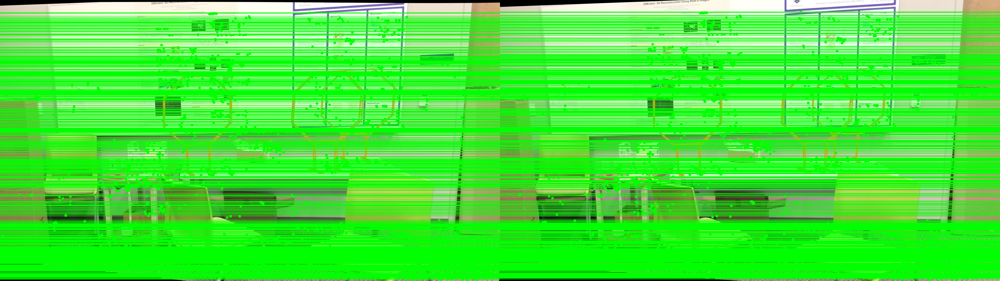

----------------------------------------------------------------------------------------------------
Disparity Map Gray 



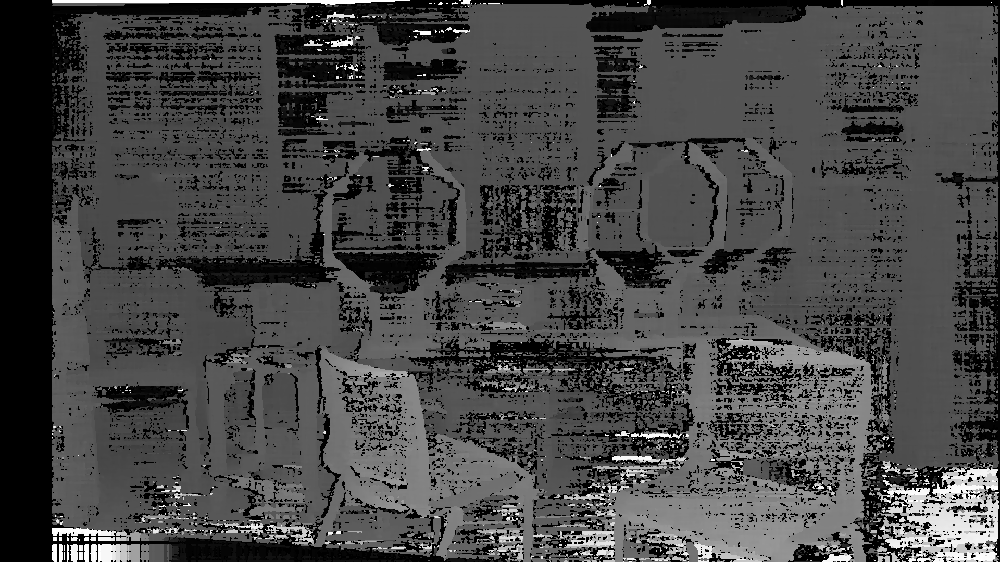

----------------------------------------------------------------------------------------------------
Disparity Map Color 



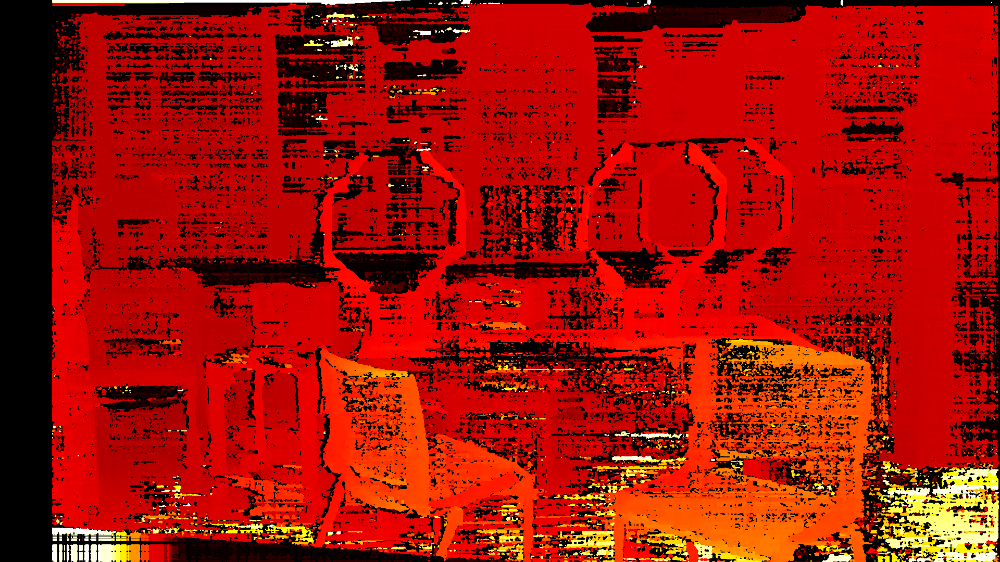

--------------------
Depth Map Gray 



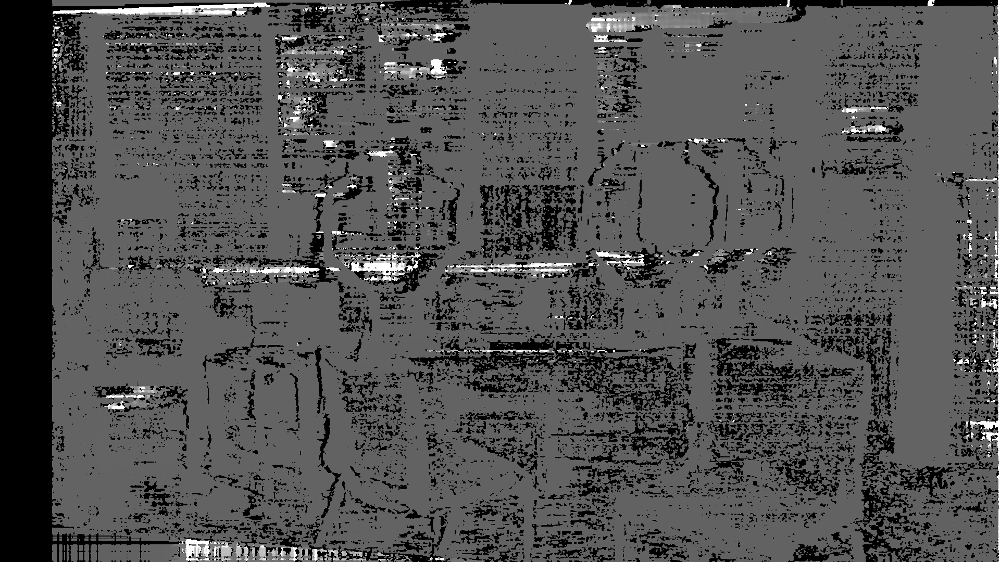

--------------------
Depth Map Color 



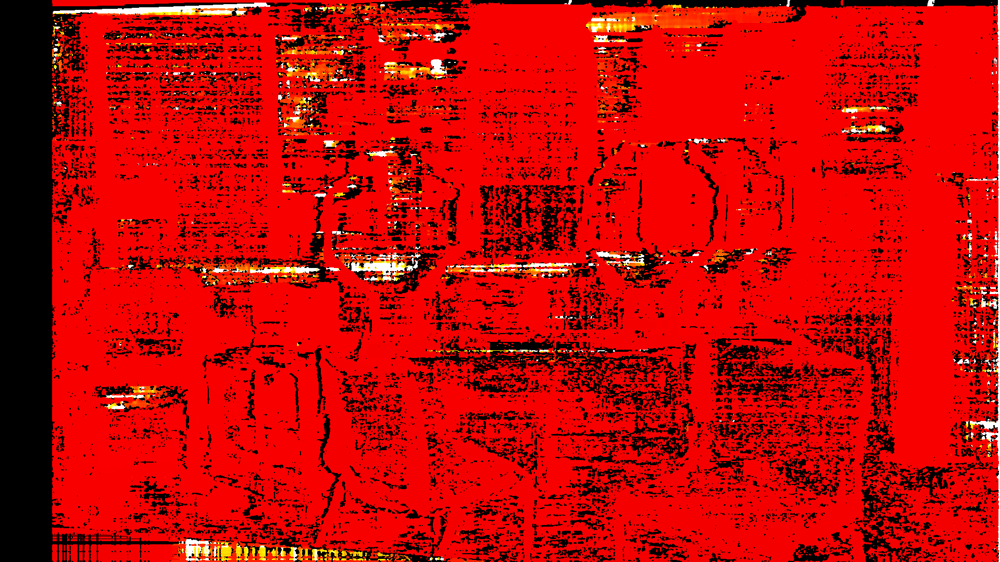

In [38]:
#Reading the Storage Room Images
image_left= cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/storageroom/im0.png')
image_right=cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/storageroom/im1.png')
#Given Camera Parameters for Storage Room
cam0=np.array([[1742.11, 0, 804.90],[0, 1742.11, 541.22],[0,0,1]])
cam1=np.array([[1742.11, 0, 804.90],[0, 1742.11, 541.22],[0,0,1]])
focal_length=1742.11
doffs=0
baseline=221.76
width=1920
height=1080
ndisp=100
vmin=29
vmax=61

#Obtaining the feature points / matching feature points between the two images
points1,points2=identifymatchingfeatures(image_left, image_right)
#Obtaining the fundamental matrix using the matching points
fundamentalmatrix,inliers = fundamental_matrix_cal(points1, points2)
#Obtaining the essential matrix using Camera Matrix and Fundamental Matrix
essentialmatrix=essentialmatrix(cam0,cam1,fundamentalmatrix)
#Decomposing essential matrix into rotation and translation matrices
rotation, translation = decomposematrix(essentialmatrix, points1, points2, cam0, cam1)
#Rectifying the images using fundamental matrix and feature points
rectified1, rectified2, p1, p2, r1, r2,H1,H2= rectification(image_left,image_right,points1,points2, fundamentalmatrix, width, height,rotation, translation,cam0,cam1)
#Displaying the H1 and H2 Matrices (HomoGraphy Matrices )
print('-----'*30)
print (" Projection Matrix 1 = \n ",p1)
print('-----'*30)
print("Projection Matrix 2 = \n", p2)
print('-----'*30)
print("Rotation Matrix 1: \n",r1)
print('-----'*30)
print("Rotation Matrix 2: \n",r2)
print('-----'*30)
print (" Homography Matrix 1 = \n ",H1)
print('-----'*30)
print (" Homography Matrix 2 = \n ",H2)
#Making a copy of the rectified images
rec1=rectified1.copy()
rec2=rectified2.copy()
#Modifying the fundamental matrix as the image was modified using homography
modified_fundamental_matrix= np.dot(np.linalg.inv(np.transpose(H2)), np.dot(fundamentalmatrix, np.linalg.inv(H1)))
#Obtaining epipolar lines for both the images
epilines_image1=epipolarlines(rectified1, rectified2, points1, points2, modified_fundamental_matrix)
epilines_image2=epipolarlines(rectified2, rectified1, points2, points1, modified_fundamental_matrix)
#Combining both the obtained images and keeping them side by side for visualization
epipolar_image=np.concatenate((epilines_image1,epilines_image2), axis=1)
print (' -----'*30)
print("Epipolar Lines for Storage Room Images")
cv2_imshow(epipolar_image)
#Obtaining the disparity map using the rectified images
disparity=disparitymap(rec1,rec2,ndisp,0,'storageroom_disparity_gray',"storageroom_disparity_color")
#Obtaining the depth map using disparity, baseline and the focal length
var=depthmap(disparity, baseline, focal_length,40000,'storageroom_depthgray','storageroom_depthcolor')

## Traproom

------------------------------------------------------------------------------------------------------------------------------------------------------
 Projection Matrix 1 = 
  [[1.76902000e+03 0.00000000e+00 1.27189002e+03 0.00000000e+00]
 [0.00000000e+00 1.76902000e+03 5.27169968e+02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Projection Matrix 2 = 
 [[ 1.76902000e+03  0.00000000e+00  1.27189002e+03 -1.76902000e+03]
 [ 0.00000000e+00  1.76902000e+03  5.27169968e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Rotation Matrix 1: 
 [[ 1.00000000e+00  2.56822020e-15  2.98711223e-15]
 [-2.56864232e-15  9.99999990e-01

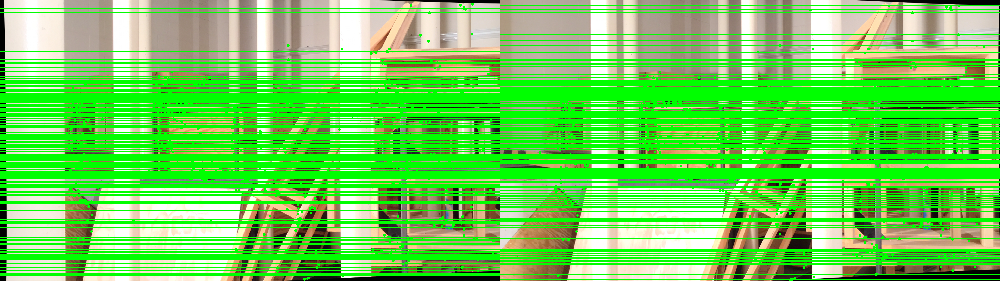

----------------------------------------------------------------------------------------------------
Disparity Map Gray 



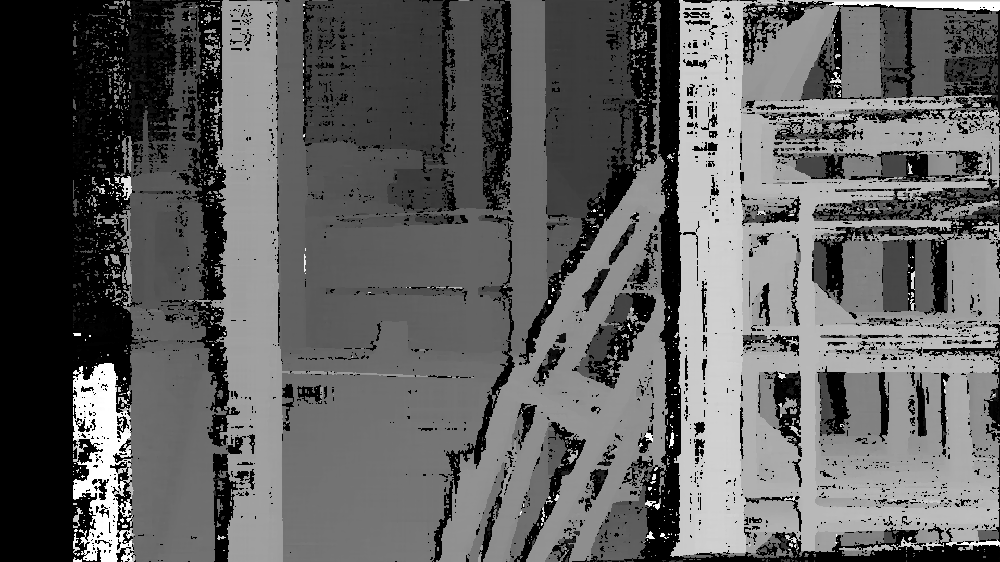

----------------------------------------------------------------------------------------------------
Disparity Map Color 



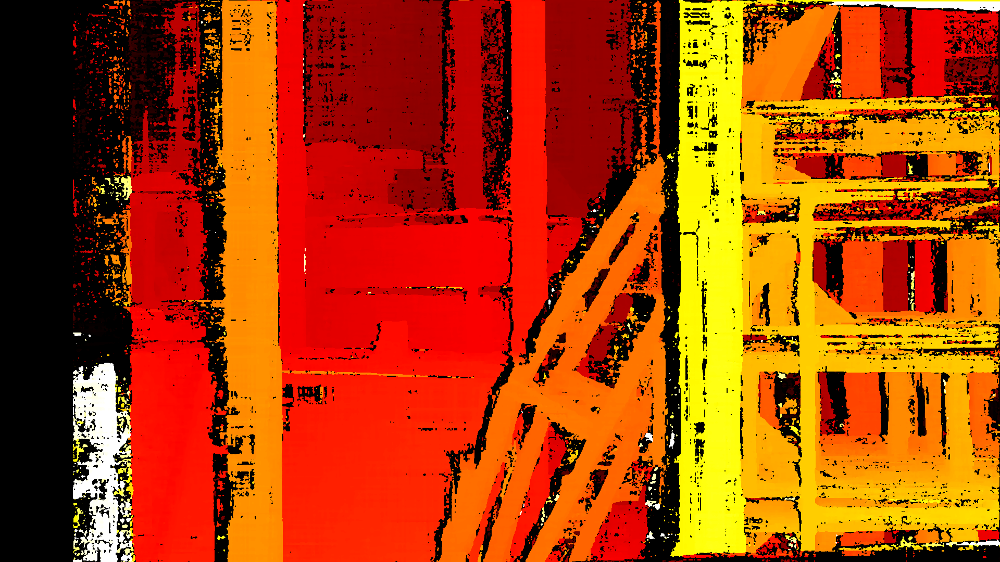

--------------------
Depth Map Gray 



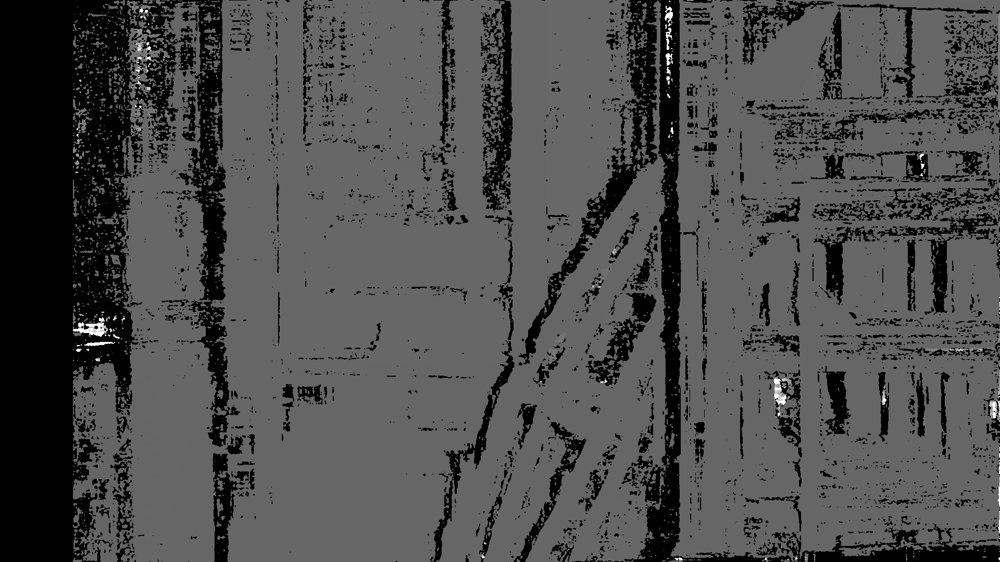

--------------------
Depth Map Color 



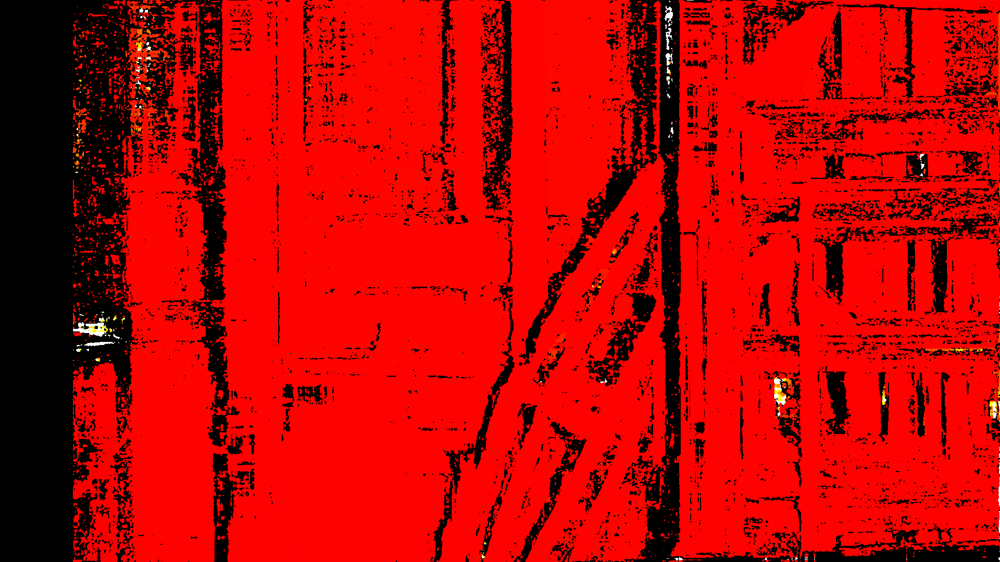

In [36]:
#Traproom
image_left= cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/traproom/im0.png')
image_right=cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/traproom/im1.png')

#Camera Parameters For Traproom
cam0=np.array([[1769.02 ,0, 1271.89],[0 ,1769.02, 527.17],[0,0,1]])
cam1=np.array([[1769.02 ,0, 1271.89],[0 ,1769.02, 527.17],[0,0,1]])
focal_length=1769.02
doffs=0
baseline=295.44
width=1920
height=1080
ndisp=140
vmin=25
vmax=118

#Obtaining the feature points / matching feature points between the two images
points1,points2=identifymatchingfeatures(image_left, image_right)
#Obtaining the fundamental matrix using the matching points
fundamentalmatrix,inliers = fundamental_matrix_cal(points1, points2)
#Obtaining the essential matrix using Camera Matrix and Fundamental Matrix
essentialmatrix=essentialmatrix(cam0,cam1,fundamentalmatrix)
#Decomposing essential matrix into rotation and translation matrices
rotation, translation = decomposematrix(essentialmatrix, points1, points2, cam0, cam1)
#Rectifying the images using fundamental matrix and feature points
rectified1, rectified2, p1, p2, r1, r2,H1,H2= rectification(image_left,image_right,points1,points2, fundamentalmatrix, width, height,rotation, translation,cam0,cam1)
#Displaying the H1 and H2 Matrices (HomoGraphy Matrices )
print('-----'*30)
print (" Projection Matrix 1 = \n ",p1)
print('-----'*30)
print("Projection Matrix 2 = \n", p2)
print('-----'*30)
print("Rotation Matrix 1: \n",r1)
print('-----'*30)
print("Rotation Matrix 2: \n",r2)
print('-----'*30)
print (" Homography Matrix 1 = \n ",H1)
print('-----'*30)
print (" Homography Matrix 2 = \n ",H2)
#Making a copy of the rectified images
rec1=rectified1.copy()
rec2=rectified2.copy()
#Modifying the fundamental matrix as the image was modified using homography
modified_fundamental_matrix= np.dot(np.linalg.inv(np.transpose(H2)), np.dot(fundamentalmatrix, np.linalg.inv(H1)))
#Obtaining epipolar lines for both the images
epilines_image1=epipolarlines(rectified1, rectified2, points1, points2, modified_fundamental_matrix)
epilines_image2=epipolarlines(rectified2, rectified1, points2, points1, modified_fundamental_matrix)
#Combining both the obtained images and keeping them side by side for visualization
epipolar_image=np.concatenate((epilines_image1,epilines_image2), axis=1)
print (' -----'*30)
print("Epipolar Lines for Traproom Room Images")
cv2_imshow(epipolar_image)
#Obtaining the disparity map using the rectified images
disparity=disparitymap(rec1,rec2,ndisp,0,'Traproom_disparity_gray',"Traproom_disparity_color")
#Obtaining the depth map using disparity, baseline and the focal length
var=depthmap(disparity, baseline, focal_length,50000,'Traproom_depthgray','Traproom_depthcolor')

## Classroom

------------------------------------------------------------------------------------------------------------------------------------------------------
 Projection Matrix 1 = 
  [[ 1.74624000e+03  0.00000000e+00 -8.31136508e+01  0.00000000e+00]
 [ 0.00000000e+00  1.74624000e+03  5.29126251e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Projection Matrix 2 = 
 [[ 1.74624000e+03  0.00000000e+00 -8.31136508e+01 -1.74624000e+03]
 [ 0.00000000e+00  1.74624000e+03  5.29126251e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]
------------------------------------------------------------------------------------------------------------------------------------------------------
Rotation Matrix 1: 
 [[ 9.99426073e-01 -4.66960377e-03  3.35517459e-02]
 [ 4.67965949e-03  9.

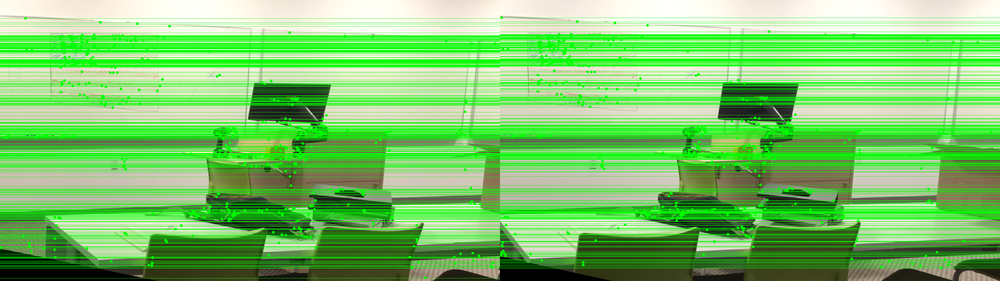

----------------------------------------------------------------------------------------------------
Disparity Map Gray 



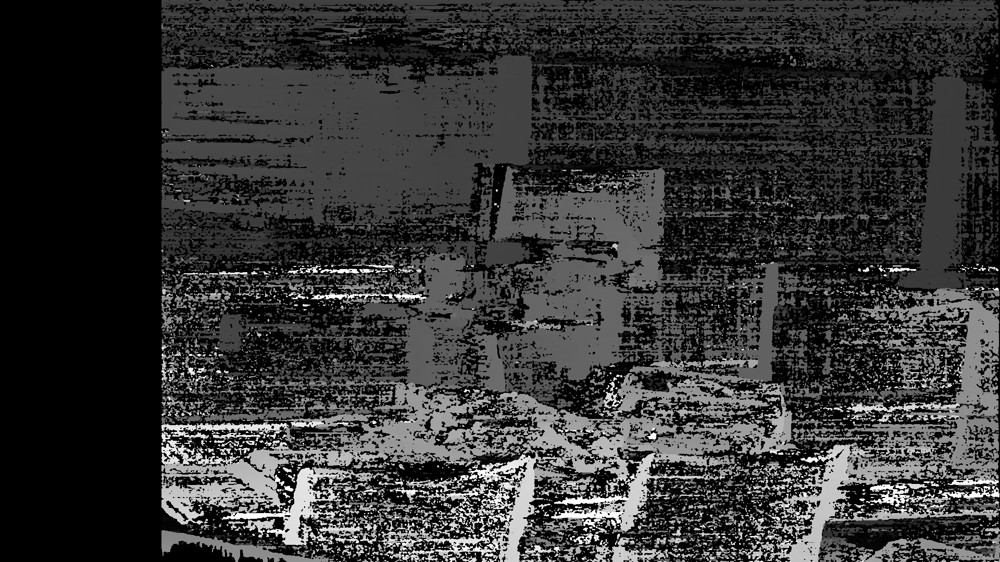

----------------------------------------------------------------------------------------------------
Disparity Map Color 



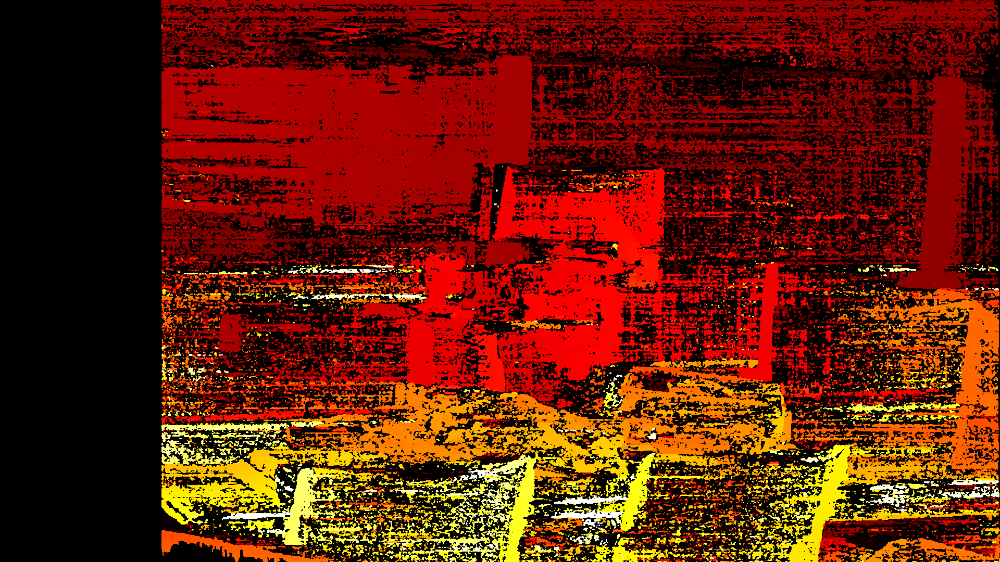

--------------------
Depth Map Gray 



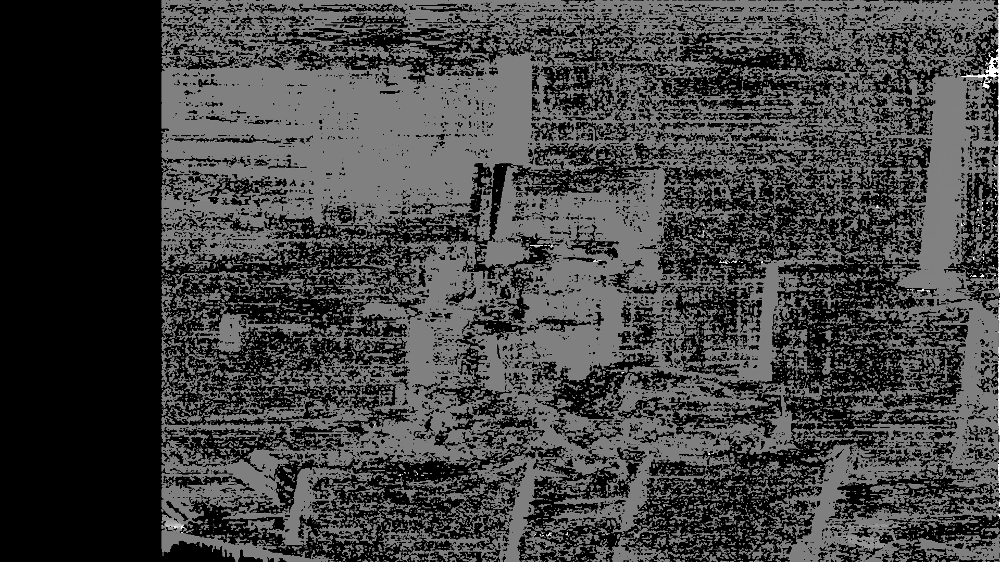

--------------------
Depth Map Color 



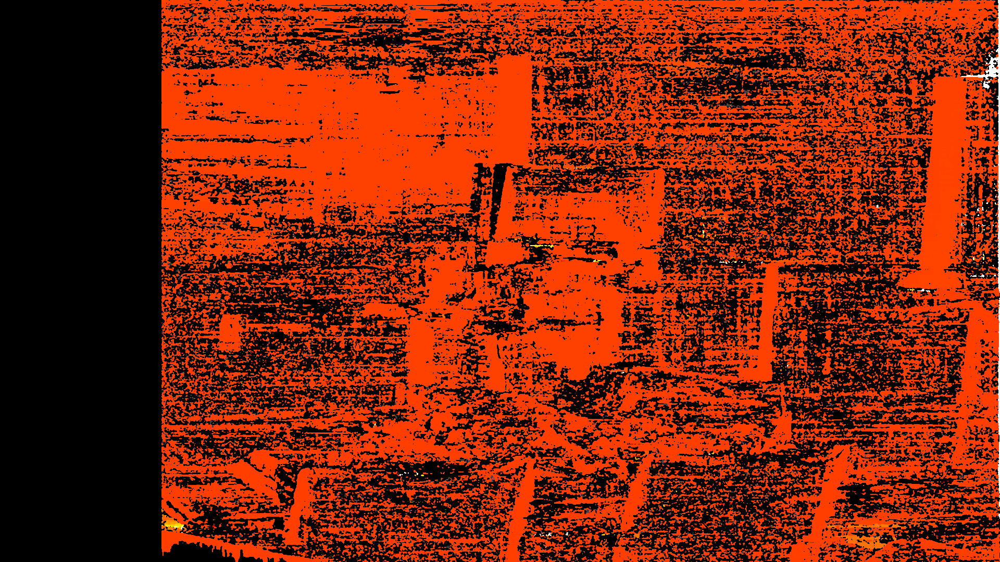

In [34]:
#Classroom
cam0=np.array([[1746.24, 0 ,14.88],[0 ,1746.24, 534.11],[0,0,1]])
cam1=np.array([[1746.24, 0 ,14.88],[0 ,1746.24, 534.11],[0,0,1]])
focal_length=1746.24
doffs=0
baseline=678.37
width=1920
height=1080
ndisp=310
vmin=60
vmax=280

#Read the images
image_left= cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/classroom/im0.png')
image_right=cv.imread('/content/drive/MyDrive/ENPM673/Project3/Part2/classroom/im1.png')

gray_img=cv.cvtColor(image_left, cv.COLOR_BGR2GRAY)

#Obtaining the feature points / matching feature points between the two images
points1,points2=identifymatchingfeatures(image_left, image_right)
#Obtaining the fundamental matrix using the matching points
fundamentalmatrix,inliers = fundamental_matrix_cal(points1, points2)
#Obtaining the essential matrix using Camera Matrix and Fundamental Matrix
essentialmatrix=essentialmatrix(cam0,cam1,fundamentalmatrix)
#Decomposing essential matrix into rotation and translation matrices
rotation, translation = decomposematrix(essentialmatrix, points1, points2, cam0, cam1)
#Rectifying the images using fundamental matrix and feature points
rectified1, rectified2, p1, p2, r1, r2,H1,H2= rectification(image_left,image_right,points1,points2, fundamentalmatrix, width, height,rotation, translation,cam0,cam1)
#Displaying the H1 and H2 Matrices (HomoGraphy Matrices )
print('-----'*30)
print (" Projection Matrix 1 = \n ",p1)
print('-----'*30)
print("Projection Matrix 2 = \n", p2)
print('-----'*30)
print("Rotation Matrix 1: \n",r1)
print('-----'*30)
print("Rotation Matrix 2: \n",r2)
print('-----'*30)
print (" Homography Matrix 1 = \n ",H1)
print('-----'*30)
print (" Homography Matrix 2 = \n ",H2)
#Making a copy of the rectified images
rec1=rectified1.copy()
rec2=rectified2.copy()
#Modifying the fundamental matrix as the image was modified using homography
modified_fundamental_matrix= np.dot(np.linalg.inv(np.transpose(H2)), np.dot(fundamentalmatrix, np.linalg.inv(H1)))
#Obtaining epipolar lines for both the images
epilines_image1=epipolarlines(rectified1, rectified2, points1, points2, modified_fundamental_matrix)
epilines_image2=epipolarlines(rectified2, rectified1, points2, points1, modified_fundamental_matrix)
#Combining both the obtained images and keeping them side by side for visualization
epipolar_image=np.concatenate((epilines_image1,epilines_image2), axis=1)
print (' -----'*30)
print("Epipolar Lines for Classroom Room Images")
cv2_imshow(epipolar_image)
#Obtaining the disparity map using the rectified images
disparity=disparitymap(rec1,rec2,ndisp,0,'Classroom_disparity_gray',"Classroom_disparity_color")
#Obtaining the depth map using disparity, baseline and the focal length
var=depthmap(disparity, baseline, focal_length,75000,'Classroom_depthgray','Classroom_depthcolor')